In [82]:
import numpy as np
import pandas as pd

# Data cleaning

## Data discovery

In [83]:
data=pd.read_csv("data.csv")

In [84]:
data.dtypes.value_counts()

float64    93
int64       3
dtype: int64

In [85]:
isnulltable=pd.DataFrame(data.isna().sum(), columns=["value"])
isnulltable.reset_index()
isnulltable.loc[isnulltable["value"]>0]

,value


In [86]:
pd.set_option('display.max_rows', 100)
pd.options.display.float_format='{:.2f}'.format
data.describe().T.sort_values(by="max", ascending=False).nlargest(25, 'max')

# 6819 rows 
# 96 columns 

,count,mean,std,min,25%,50%,75%,max
Current Asset Turnover Rate,6819.00,1195855763.31,2821161238.26,0.00,0.00,0.00,0.00,10000000000.00
Cash Turnover Rate,6819.00,2471976967.44,2938623226.68,0.00,0.00,1080000000.00,4510000000.00,10000000000.00
Quick Asset Turnover Rate,6819.00,2163735272.03,3374944402.17,0.00,0.00,0.00,4900000000.00,10000000000.00
Inventory Turnover Rate (times),6819.00,2149106056.61,3247967014.05,0.00,0.00,0.00,4620000000.00,9990000000.00
Total Asset Growth Rate,6819.00,5508096595.25,2897717771.17,0.00,4860000000.00,6400000000.00,7390000000.00,9990000000.00
Fixed Assets Turnover Frequency,6819.00,1008595981.82,2477557316.92,0.00,0.00,0.00,0.00,9990000000.00
Operating Expense Rate,6819.00,1995347312.80,3237683890.52,0.00,0.00,0.00,4145000000.00,9990000000.00
Research and development expense rate,6819.00,1950427306.06,2598291554.00,0.00,0.00,509000000.00,3450000000.00,9980000000.00
Total debt/Total net worth,6819.00,4416336.71,168406905.28,0.00,0.00,0.01,0.01,9940000000.00
Inventory/Current Liability,6819.00,55806804.53,582051554.62,0.00,0.00,0.01,0.01,9910000000.00


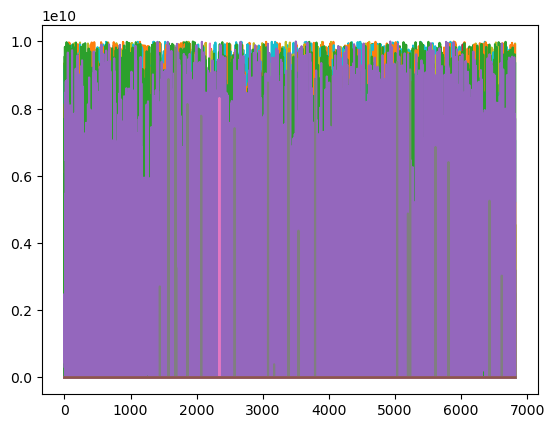

In [87]:
import matplotlib
from matplotlib import pyplot as plt 
data.plot(legend=False)
plt.show()

## Correlations

In [88]:
# import pandas as pd
# import numpy as np

# df = pd.DataFrame({'A': [1,2,3,4,5],'B': [1,2,3,4,5], 'C':[7,3,89,2,40]})
# display(df)

# # # Create correlation matrix
# corr_matrix = df.corr().abs()
# # # Select upper triangle of correlation matrix
# upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
# # # Find features with correlation greater than 0.85
# to_drop = [column for column in upper.columns if any(upper[column] > 0.85)]

# print(f"Columns to drop: {to_drop}")
# print(f"Number of columns to drop; {len(to_drop)}")

# # # Drop features
# df.drop(to_drop, axis=1, inplace=True)
# display(df)

In [89]:
import seaborn as sns
data_matrix=data.corr()
data_matrix

for column in data_matrix:
    print(data_matrix[column].values)

[ 1.00000000e+00 -2.60806558e-01 -2.82940585e-01 -2.73051318e-01
 -1.00043244e-01 -9.94452496e-02 -2.29817399e-04 -8.51654796e-03
 -8.85722326e-03 -1.65926376e-02 -8.39485899e-03 -6.08322551e-03
 -2.42319684e-02 -7.23555512e-02 -2.30628090e-02 -1.09705669e-01
 -1.65399021e-01 -1.65464759e-01 -1.64783924e-01 -2.19559681e-01
 -7.75164598e-02 -4.69203820e-03 -1.42050582e-01 -2.01394834e-01
 -4.58383763e-04 -1.51679461e-02 -3.77829729e-02 -3.68196768e-02
 -9.40090214e-03 -4.44310214e-02  6.53294244e-02 -1.68576794e-02
 -5.13452043e-02 -2.21128025e-03  2.50582887e-02 -2.68093382e-03
  1.23135860e-02  2.50160962e-01 -2.50160962e-01  1.69199048e-02
  1.76542936e-01  7.04545248e-02 -1.41111324e-01 -2.07856520e-01
  7.52780821e-02 -6.79151672e-02 -4.75386744e-03 -6.55553959e-03
 -1.37584476e-03  7.28182642e-02  2.10891883e-02  3.97184765e-02
 -9.28421410e-02  2.82880213e-03 -1.93083376e-01 -8.63821115e-02
 -4.48233389e-02 -1.00130190e-01 -3.82278014e-03  7.79210962e-02
  1.94494436e-01 -7.70819

In [90]:
# 
# for each column, 
# print column name, 
# if the value of the row is > to 0.9, 
# print the name of the row 
#
# for column in data_matrix:
#     print(column)
#     for i in data_matrix[column].values:
#         if i > 0.9:
#             print(i)
#
# for (columnName, columnData) in data_matrix.iteritems():
#     print('Column Name :', columnName)
#     #if columnData.values >0.9:
#         print('Correlation Value:', columnData.values)
#         print('Row Index:', columnData.index)

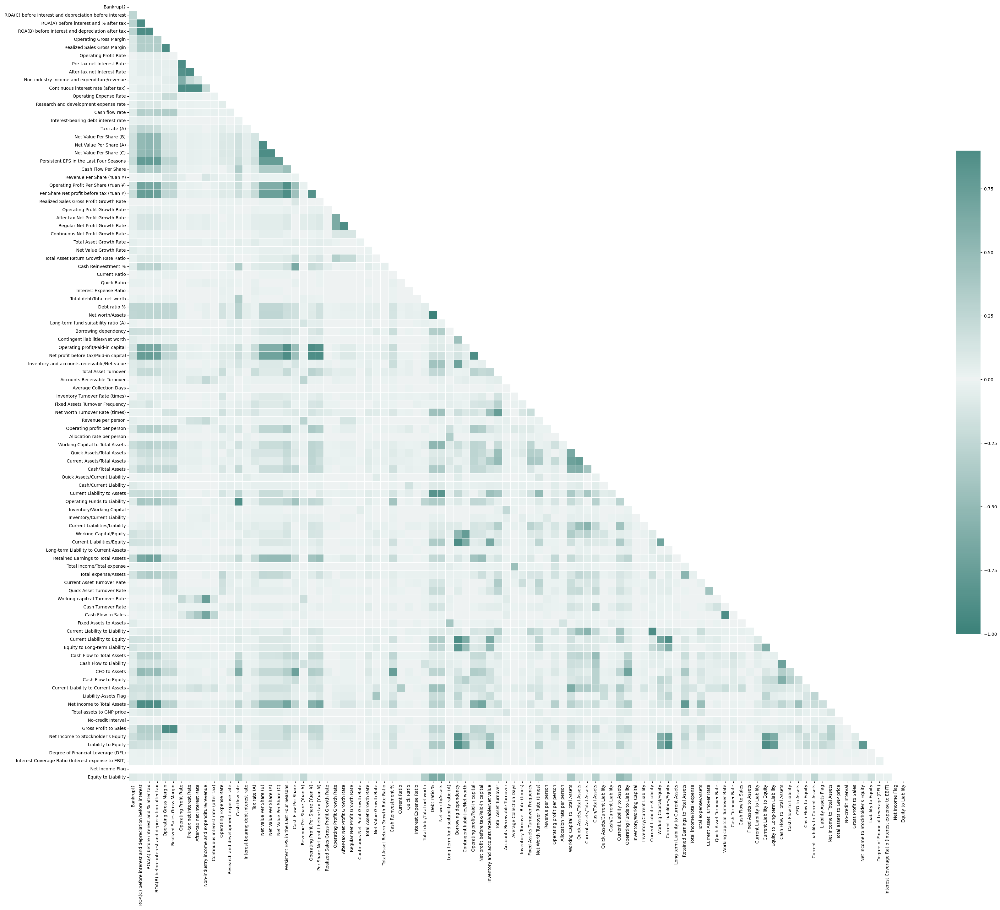

In [91]:
mask=np.zeros_like(data_matrix, dtype=bool)
mask[np.triu_indices_from(mask)]= True
cmap=sns.diverging_palette(180, 180, as_cmap=True)

plt.figure(figsize=(40,40))
sns.plot = sns.heatmap(
    data_matrix, 
    mask=mask,
    cmap=cmap,
    vmax=.9,
    center=0,
    square=True,
    linewidths=.5,
    cbar_kws={"shrink": .5},
    #annot=True, 
    #fmt=".1f"
)

In [92]:
upper_tri = data_matrix.where(np.triu(np.ones(data_matrix.shape),k=1).astype(bool))

In [93]:
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.90)]

In [94]:
len(to_drop)

18

In [95]:
data.drop(columns=to_drop, inplace=True)

In [96]:
data.to_csv("data_corr_dropped.csv", sep=";", index=False)

## Dropping columns with low variance

In [16]:
data.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,Operating Gross Margin,Operating Profit Rate,Non-industry income and expenditure/revenue,Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),...,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Total assets to GNP price,No-credit Interval,Net Income to Stockholder's Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,...,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00
mean,0.03,0.51,0.61,1.00,0.30,1995347312.80,1950427306.06,0.47,16448012.91,0.12,...,0.32,0.03,0.00,18629417.81,0.62,0.84,0.03,0.57,1.00,0.05
std,0.18,0.06,0.02,0.01,0.01,3237683890.52,2598291554.00,0.02,108275033.53,0.14,...,0.01,0.03,0.03,376450059.75,0.01,0.01,0.02,0.01,0.00,0.05
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
25%,0.00,0.48,0.60,1.00,0.30,0.00,0.00,0.46,0.00,0.00,...,0.31,0.02,0.00,0.00,0.62,0.84,0.03,0.57,1.00,0.02
50%,0.00,0.50,0.61,1.00,0.30,0.00,509000000.00,0.47,0.00,0.07,...,0.31,0.03,0.00,0.00,0.62,0.84,0.03,0.57,1.00,0.03
75%,0.00,0.54,0.61,1.00,0.30,4145000000.00,3450000000.00,0.47,0.00,0.21,...,0.32,0.04,0.00,0.01,0.62,0.84,0.03,0.57,1.00,0.05
max,1.00,1.00,1.00,1.00,1.00,9990000000.00,9980000000.00,1.00,990000000.00,1.00,...,1.00,1.00,1.00,9820000000.00,1.00,1.00,1.00,1.00,1.00,1.00


In [17]:
pd.set_option('display.max_rows', 100)
pd.options.display.float_format='{:.2f}'.format

In [18]:
low_var_table= data.var().to_frame().sort_values(by=0)


In [19]:
todrop2=low_var_table.loc[low_var_table[0]<0.01].T.columns.tolist()

In [20]:
len(todrop2)

47

In [21]:
data.drop(columns=todrop2, inplace=True)

In [22]:
data.to_csv("data_low_var_dropped.csv", sep=";")

## Checking odd values/ missing/ 0

In [23]:
data.head()

,Bankrupt?,Operating Expense Rate,Research and development expense rate,Interest-bearing debt interest rate,Tax rate (A),Revenue Per Share (Yuan ¥),Total Asset Growth Rate,Net Value Growth Rate,Current Ratio,Quick Ratio,...,Quick Assets/Current Liability,Cash/Current Liability,Inventory/Current Liability,Current Liabilities/Liability,Long-term Liability to Current Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Cash Turnover Rate,Fixed Assets to Assets,Total assets to GNP price
0,1,0.00,0.00,0.00,0.00,0.02,4980000000.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.68,0.03,701000000.00,6550000000.00,458000000.00,0.42,0.01
1,1,0.00,0.00,0.00,0.00,0.02,6110000000.00,0.00,0.01,0.00,...,0.00,0.00,0.01,0.31,0.02,0.00,7700000000.00,2490000000.00,0.47,0.01
2,1,0.00,25500000.00,0.00,0.00,0.01,7280000000.00,0.00,0.01,0.01,...,0.01,5340000000.00,0.01,0.45,0.00,0.00,0.00,761000000.00,0.28,0.04
3,1,0.00,0.00,0.00,0.00,0.01,4880000000.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.62,0.02,8140000000.00,6050000000.00,2030000000.00,0.56,0.00
4,1,7890000000.00,0.00,0.00,0.00,0.03,5510000000.00,0.00,0.01,0.00,...,0.00,0.00,0.00,0.98,0.00,6680000000.00,5050000000.00,824000000.00,0.31,0.00


In [24]:
data.describe().T.sort_values(by="max", ascending=False)

,count,mean,std,min,25%,50%,75%,max
Cash Turnover Rate,6819.00,2471976967.44,2938623226.68,0.00,0.00,1080000000.00,4510000000.00,10000000000.00
Quick Asset Turnover Rate,6819.00,2163735272.03,3374944402.17,0.00,0.00,0.00,4900000000.00,10000000000.00
Current Asset Turnover Rate,6819.00,1195855763.31,2821161238.26,0.00,0.00,0.00,0.00,10000000000.00
Fixed Assets Turnover Frequency,6819.00,1008595981.82,2477557316.92,0.00,0.00,0.00,0.00,9990000000.00
Total Asset Growth Rate,6819.00,5508096595.25,2897717771.17,0.00,4860000000.00,6400000000.00,7390000000.00,9990000000.00
Operating Expense Rate,6819.00,1995347312.80,3237683890.52,0.00,0.00,0.00,4145000000.00,9990000000.00
Inventory Turnover Rate (times),6819.00,2149106056.61,3247967014.05,0.00,0.00,0.00,4620000000.00,9990000000.00
Research and development expense rate,6819.00,1950427306.06,2598291554.00,0.00,0.00,509000000.00,3450000000.00,9980000000.00
Total debt/Total net worth,6819.00,4416336.71,168406905.28,0.00,0.00,0.01,0.01,9940000000.00
Inventory/Current Liability,6819.00,55806804.53,582051554.62,0.00,0.00,0.01,0.01,9910000000.00


In [25]:
#data.loc[~(data==0).all(axis=1)]

## Pairplot exploration of features

In [131]:
#sns.pairplot(data, hue='Bankrupt?')
# this is cute but it takes a while ! 

## Outliers

Bankrupt?


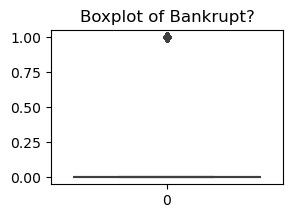

 Operating Expense Rate


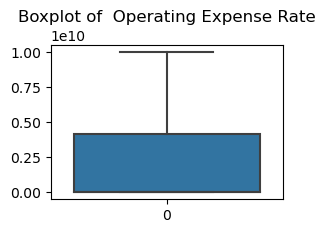

 Research and development expense rate


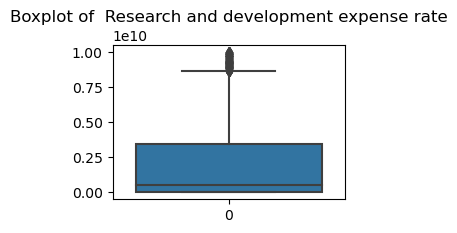

 Interest-bearing debt interest rate


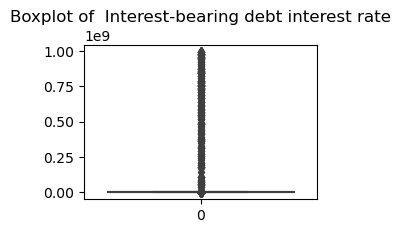

 Tax rate (A)


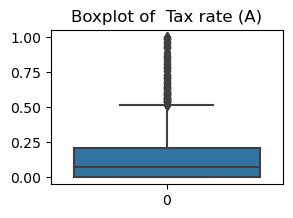

 Revenue Per Share (Yuan ¥)


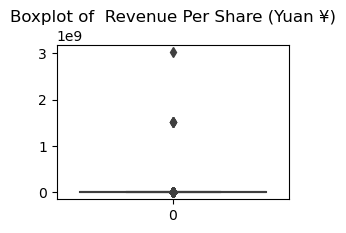

 Total Asset Growth Rate


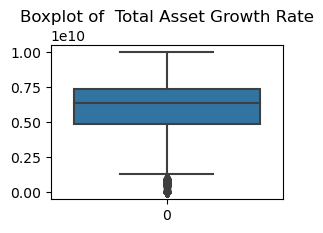

 Net Value Growth Rate


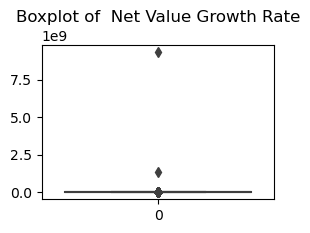

 Current Ratio


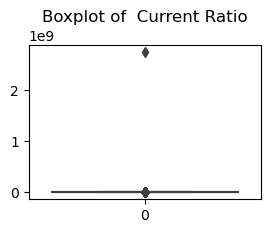

 Quick Ratio


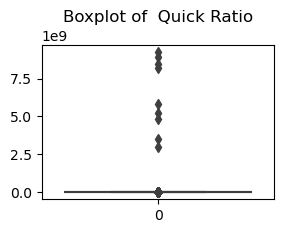

 Total debt/Total net worth


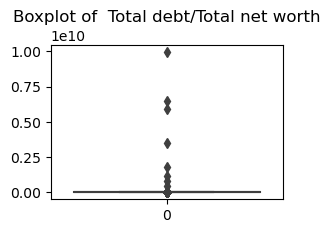

 Total Asset Turnover


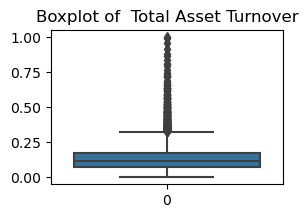

 Accounts Receivable Turnover


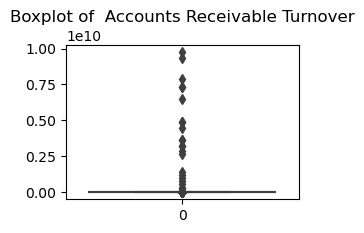

 Average Collection Days


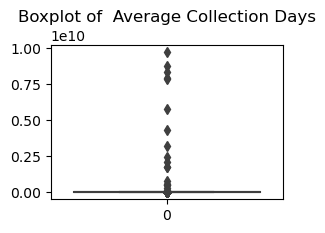

 Inventory Turnover Rate (times)


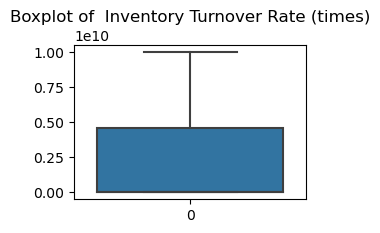

 Fixed Assets Turnover Frequency


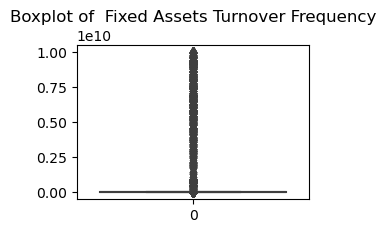

 Revenue per person


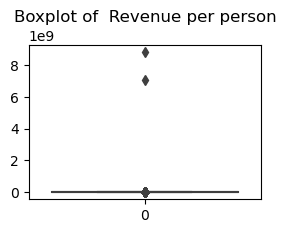

 Allocation rate per person


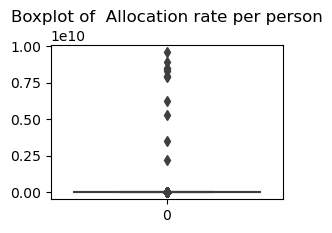

 Quick Assets/Total Assets


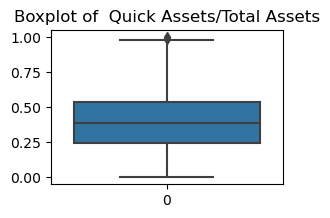

 Current Assets/Total Assets


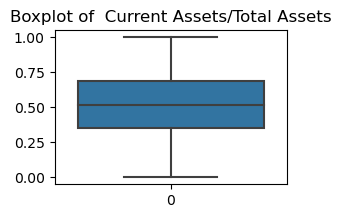

 Cash/Total Assets


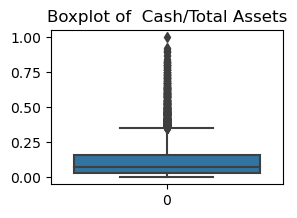

 Quick Assets/Current Liability


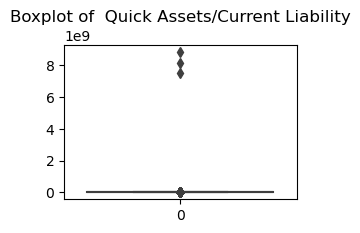

 Cash/Current Liability


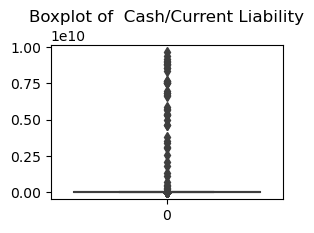

 Inventory/Current Liability


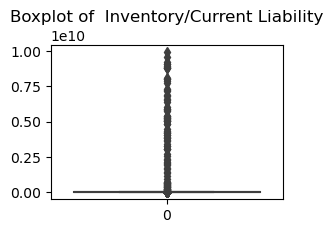

 Current Liabilities/Liability


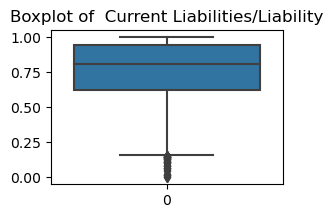

 Long-term Liability to Current Assets


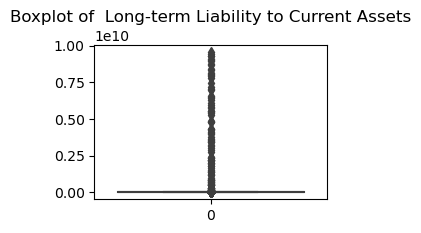

 Current Asset Turnover Rate


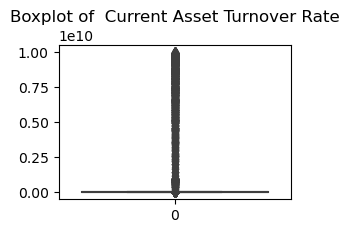

 Quick Asset Turnover Rate


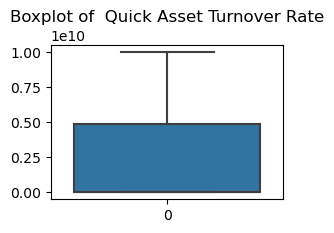

 Cash Turnover Rate


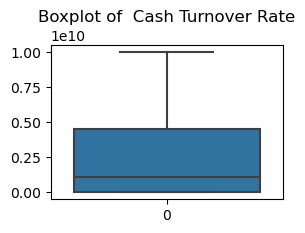

 Fixed Assets to Assets


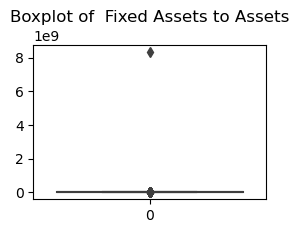

 Total assets to GNP price


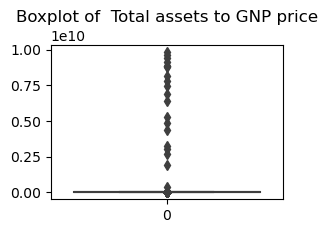

In [27]:
for col in data.columns:
    print(col)
    plt.figure(figsize=(3,2))
    sns.boxplot(data[col])
    plt.title(f'Boxplot of {col}')
    plt.show()
    

In [28]:
# we have a LOT of outliers in our dataset so we might get back to this 

# Data preprocessing

In [26]:
data.describe()
# Very different values, we may need to scale. 

,Bankrupt?,Operating Expense Rate,Research and development expense rate,Interest-bearing debt interest rate,Tax rate (A),Revenue Per Share (Yuan ¥),Total Asset Growth Rate,Net Value Growth Rate,Current Ratio,Quick Ratio,...,Quick Assets/Current Liability,Cash/Current Liability,Inventory/Current Liability,Current Liabilities/Liability,Long-term Liability to Current Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Cash Turnover Rate,Fixed Assets to Assets,Total assets to GNP price
count,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,...,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00
mean,0.03,1995347312.80,1950427306.06,16448012.91,0.12,1328640.60,5508096595.25,1566212.06,403284.95,8376594.82,...,3592902.20,37159994.15,55806804.53,0.76,54160038.14,1195855763.31,2163735272.03,2471976967.44,1220120.50,18629417.81
std,0.18,3237683890.52,2598291554.00,108275033.53,0.14,51707089.77,2897717771.17,114159389.52,33302155.83,244684748.45,...,171620908.61,510350903.16,582051554.62,0.21,570270621.96,2821161238.26,3374944402.17,2938623226.68,100754158.71,376450059.75
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,0.00,0.00,0.02,4860000000.00,0.00,0.01,0.00,...,0.01,0.00,0.00,0.63,0.00,0.00,0.00,0.00,0.09,0.00
50%,0.00,0.00,509000000.00,0.00,0.07,0.03,6400000000.00,0.00,0.01,0.01,...,0.01,0.00,0.01,0.81,0.00,0.00,0.00,1080000000.00,0.20,0.00
75%,0.00,4145000000.00,3450000000.00,0.00,0.21,0.05,7390000000.00,0.00,0.02,0.01,...,0.01,0.01,0.01,0.94,0.01,0.00,4900000000.00,4510000000.00,0.37,0.01
max,1.00,9990000000.00,9980000000.00,990000000.00,1.00,3020000000.00,9990000000.00,9330000000.00,2750000000.00,9230000000.00,...,8820000000.00,9650000000.00,9910000000.00,1.00,9540000000.00,10000000000.00,10000000000.00,10000000000.00,8320000000.00,9820000000.00


In [29]:
X= data.drop(columns="Bankrupt?")
y= data["Bankrupt?"]

In [30]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.2, 
                                                   random_state=42)

### Scaling option 1 = Standard Scaler

In [31]:
# note we are choosing Standard Scaler vs MinMax 
# because the 1st one is less sensitive to outliers 
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
X_train_ss= scaler.fit_transform(X_train)
X_test_ss= scaler.transform(X_test)

### Scaling option 2 = Min Max Scaler

In [32]:
from sklearn.preprocessing import MinMaxScaler
scaler= MinMaxScaler()
X_train_mms= scaler.fit_transform(X_train)
X_test_mms= scaler.transform(X_test)

# Modeling

In [33]:
from sklearn.metrics import (confusion_matrix,
    accuracy_score, precision_score, recall_score,
    precision_recall_curve, roc_curve, roc_auc_score)

### Baseline with logistic regression - scaled with Standard Scaler

In [75]:
from sklearn.linear_model import LogisticRegression
Logreg1=LogisticRegression()

Logreg1.fit(X_train_ss, y_train)
y_pred_Logreg1 = Logreg1.predict(X_test_ss)
Logreg1_scores= [accuracy_score(y_test, y_pred_Logreg1), precision_score(y_test, y_pred_Logreg1), recall_score(y_test, y_pred_Logreg1), roc_auc_score(y_test, y_pred_Logreg1)]
cmLogreg1= confusion_matrix(y_test, y_pred_Logreg1).tolist()
cmLogreg1=[el for i in cmLogreg1 for el in i]
print(cmLogreg1)
scores_logreg1= (pd.DataFrame(list(zip(Logreg1_scores + cmLogreg1)),
               columns = ["LogisticReg Lowvar_dropped Standard_scale"], 
               index =['Accuracy', 'Precision', 'Recall', 'Roc Auc', 'TrueNeg', 'FalsePos', 'FalseNeg', 'TruePos'])).T
scores_logreg1

[1313, 0, 50, 1]


,Accuracy,Precision,Recall,Roc Auc,TrueNeg,FalsePos,FalseNeg,TruePos
LogisticReg Lowvar_dropped Standard_scale,0.96,1.00,0.02,0.51,1313.00,0.00,50.00,1.00


### Baseline with logistic regression - scaled with Min Max Scaler

In [79]:
Logreg2=LogisticRegression()
Logreg2.fit(X_train_mms, y_train)
y_pred_Logreg2 = Logreg2.predict(X_test_mms)
Logreg2_scores= [accuracy_score(y_test, y_pred_Logreg2), precision_score(y_test, y_pred_Logreg2), recall_score(y_test, y_pred_Logreg2), roc_auc_score(y_test, y_pred_Logreg2)]
cmLogreg2= confusion_matrix(y_test, y_pred_Logreg2).tolist()
cmLogreg2=[el for i in cmLogreg2 for el in i]
print(cmLogreg2)
scores_logreg2 = (pd.DataFrame(list(zip(Logreg2_scores + cmLogreg2)),
               columns = ["Logistic_Regression Mowvar_dropped MinMax_scale"], 
               index =['Accuracy', 'Precision', 'Recall', 'Roc Auc', 'TrueNeg', 'FalsePos', 'FalseNeg', 'TruePos'])).T
scores_logreg2

[1313, 0, 50, 1]


,Accuracy,Precision,Recall,Roc Auc,TrueNeg,FalsePos,FalseNeg,TruePos
Logistic_Regression Mowvar_dropped MinMax_scale,0.96,1.00,0.02,0.51,1313.00,0.00,50.00,1.00


In [77]:
pd.concat([scores_logreg1, scores_logreg2])

,Accuracy,Precision,Recall,Roc Auc,TrueNeg,FalsePos,FalseNeg,TruePos,ROC AUC
LogisticReg Lowvar_dropped Standard_scale,0.96,1.00,0.02,0.51,1313.00,0.00,50.00,1.00,NaN
Logistic_Regression Mowvar_dropped MinMax_scale,0.96,1.00,0.02,NaN,1313.00,0.00,50.00,1.00,0.51


### Passive Agressive 

In [ ]:
from sklearn.linear_model import PassiveAggressiveClassifier

In [50]:
PAClass=PassiveAggressiveClassifier(C=0.01, loss='hinge', random_state=42)
# note : with all columns, the best parameter is 0.1, while with only high variance columns the best parameter was 0.01
PAClass.fit(X_train_ss, y_train)
y_pred_PAClass = PAClass.predict(X_test_ss)

PAClass_scores= [accuracy_score(y_test, y_pred_PAClass), precision_score(y_test, y_pred_PAClass), recall_score(y_test, y_pred_PAClass), roc_auc_score(y_test, y_pred_PAClass)]
cmPAClass= confusion_matrix(y_test, y_pred_PAClass).tolist()
cmPAClass=[el for i in cmPAClass for el in i]

scores_PAC1 = (pd.DataFrame(list(zip(PAClass_scores + cmPAClass)),
               columns = ["PA_Class Lowvar_dropped StandardScale"], 
               index =['Accuracy', 'Precision', 'Recall', 'Roc Auc', 'TrueNeg', 'FalsePos', 'FalseNeg', 'TruePos'])).T
scores_PAC1

,Accuracy,Precision,Recall,Roc Auc,TrueNeg,FalsePos,FalseNeg,TruePos
PA_Class Lowvar_dropped StandardScale,0.96,1.00,0.04,0.52,1313.00,0.00,49.00,2.00


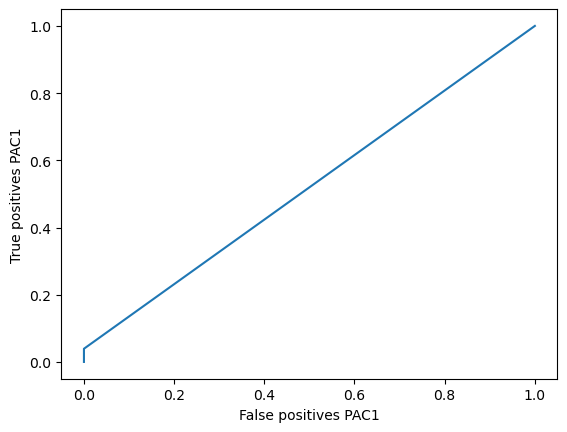

In [55]:
# plot roc_auc curve 
import matplotlib.pyplot as plt

fp, tp, _ = roc_curve(y_test, y_pred_PAClass)
fig = plt.plot(fp, tp)
plt.xlabel('False positives PAC1')
plt.ylabel('True positives PAC1');

plt.show()

In [52]:
PAClass=PassiveAggressiveClassifier(C=0.01, loss='hinge', random_state=42)
# note : with all columns, the best parameter is 0.1, while with only high variance columns the best parameter was 0.01
PAClass.fit(X_train_mms, y_train)
y_pred_PAClass2 = PAClass.predict(X_test_mms)

PAClass_scores2= [accuracy_score(y_test, y_pred_PAClass2), precision_score(y_test, y_pred_PAClass2), recall_score(y_test, y_pred_PAClass2), roc_auc_score(y_test, y_pred_PAClass2)]
cmPAClass2= confusion_matrix(y_test, y_pred_PAClass2).tolist()
cmPAClass2=[el for i in cmPAClass2 for el in i]

scores_PAC2 = (pd.DataFrame(list(zip(PAClass_scores2 + cmPAClass2)),
               columns = ["PA_Class Lowvar_dropped MinMaxScale"], 
               index =['Accuracy', 'Precision', 'Recall', 'Roc Auc', 'TrueNeg', 'FalsePos', 'FalseNeg', 'TruePos'])).T
scores_PAC2

,Accuracy,Precision,Recall,Roc Auc,TrueNeg,FalsePos,FalseNeg,TruePos
PA_Class Lowvar_dropped MinMaxScale,0.96,1.00,0.02,0.51,1313.00,0.00,50.00,1.00


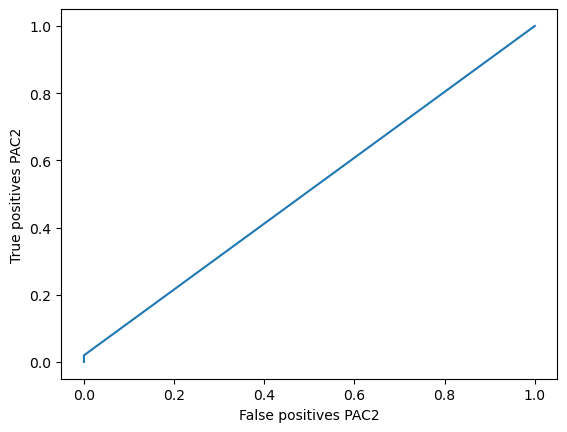

In [57]:
fp2, tp2, _ = roc_curve(y_test, y_pred_PAClass2)
fig = plt.plot(fp2, tp2)
plt.xlabel('False positives PAC2')
plt.ylabel('True positives PAC2');

plt.show()

In [53]:
pd.concat([scores_PAC1, scores_PAC2])

,Accuracy,Precision,Recall,Roc Auc,TrueNeg,FalsePos,FalseNeg,TruePos
PA_Class Lowvar_dropped StandardScale,0.96,1.00,0.04,0.52,1313.00,0.00,49.00,2.00
PA_Class Lowvar_dropped MinMaxScale,0.96,1.00,0.02,0.51,1313.00,0.00,50.00,1.00


## Parameter tuning

### Manual for C

In [58]:
accuracies_train = []
accuracies_val = []
params_grid = [0.01, 0.1, 1, 10, 100]

for param_value in params_grid:
    model = PassiveAggressiveClassifier(C=param_value, random_state=42)
    model.fit(X_train, y_train)
    Y_train_pred = model.predict(X_train)
    Y_test_pred = model.predict(X_test)
    accuracies_train.append(np.mean(Y_train_pred == y_train))
    accuracies_val.append(np.mean(Y_test_pred == y_test))

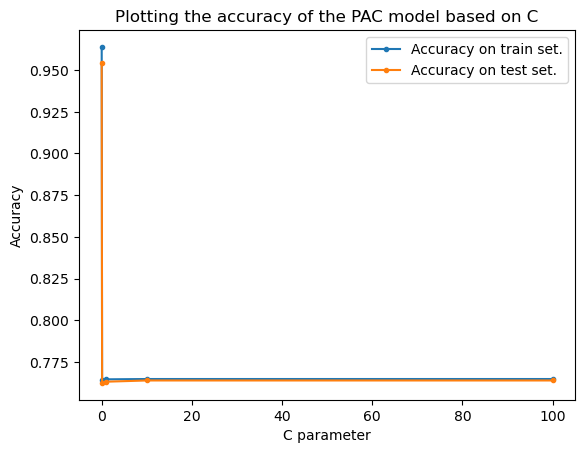

In [59]:
plt.plot(params_grid, accuracies_train, marker=".", label="Accuracy on train set.")
plt.plot(params_grid, accuracies_val, marker=".", label="Accuracy on test set.");
plt.title('Plotting the accuracy of the PAC model based on C')
plt.xlabel('C parameter')
plt.ylabel('Accuracy')
plt.legend();

### Gridsearch

In [60]:
# GridSearch for the optimal value of C 
from sklearn.model_selection import GridSearchCV
grid_search_cv = GridSearchCV(PassiveAggressiveClassifier(random_state=42), 
                              {'C': [.01, .1, 1, 10, 100]}, 
                              cv=3, scoring='roc_auc')
grid_search_cv.fit(X_train, y_train)
grid_search_cv.best_score_

0.5347479439233725

In [61]:
grid_search_cv.best_params_

{'C': 0.01}

In [50]:
grid_search_cv.cv_results_

{'mean_fit_time': array([0.00869377, 0.0090495 , 0.00912436, 0.00902804, 0.00901071]),
 'std_fit_time': array([0.00351166, 0.00190494, 0.00186433, 0.00179475, 0.00179669]),
 'mean_score_time': array([0.00138958, 0.00127792, 0.00117858, 0.00124454, 0.00110038]),
 'std_score_time': array([1.73198950e-04, 1.26201750e-04, 1.64541450e-05, 6.65362995e-05,
        2.22308190e-05]),
 'param_C': masked_array(data=[0.01, 0.1, 1, 10, 100],
              mask=[False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'C': 0.01}, {'C': 0.1}, {'C': 1}, {'C': 10}, {'C': 100}],
 'split0_test_score': array([0.5312444 , 0.53654141, 0.53134397, 0.53135392, 0.53135392]),
 'split1_test_score': array([0.48452449, 0.51483704, 0.50814821, 0.49940206, 0.49940206]),
 'split2_test_score': array([0.58847495, 0.52364399, 0.4752108 , 0.4752108 , 0.4752108 ]),
 'mean_test_score': array([0.53474794, 0.52500748, 0.50490099, 0.50198893, 0.50198893]),
 'std_test_score': array([

## Handling imbalance 

In [63]:
scaler= StandardScaler().fit(X_train)
X_train_ss_db= pd.DataFrame(scaler.transform(X_train), columns=X.columns)

In [64]:
new_data= X_train_ss_db.join(y_train)
new_data

,Operating Expense Rate,Research and development expense rate,Interest-bearing debt interest rate,Tax rate (A),Revenue Per Share (Yuan ¥),Total Asset Growth Rate,Net Value Growth Rate,Current Ratio,Quick Ratio,Total debt/Total net worth,...,Cash/Current Liability,Inventory/Current Liability,Current Liabilities/Liability,Long-term Liability to Current Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Cash Turnover Rate,Fixed Assets to Assets,Total assets to GNP price,Bankrupt?
0,1.53,0.29,-0.15,0.77,-0.03,0.01,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-1.64,-0.09,2.93,1.25,0.03,0.62,-0.05,1.00
1,-0.62,-0.75,-0.15,-0.84,-0.03,-1.92,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,1.07,-0.09,-0.42,-0.64,-0.84,-1.18,-0.05,1.00
2,-0.62,-0.75,-0.15,0.54,-0.03,-1.92,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-0.59,-0.09,-0.42,-0.64,-0.53,-0.49,-0.05,1.00
3,-0.52,-0.75,-0.15,1.02,-0.03,1.27,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.15,-0.09,2.09,1.21,-0.84,-0.36,-0.05,1.00
4,-0.62,-0.75,-0.15,0.25,-0.03,0.34,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-0.08,-0.09,-0.42,2.12,-0.58,-0.65,-0.05,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5450,0.27,-0.47,-0.15,0.74,-0.03,0.37,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.96,-0.09,3.11,1.41,-0.84,-0.84,-0.05,0.00
5451,-0.62,2.30,-0.15,-0.75,-0.03,0.77,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.88,-0.09,-0.42,-0.64,1.98,-0.04,-0.05,0.00
5452,-0.62,-0.75,-0.15,-0.41,-0.03,0.11,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.93,-0.09,-0.42,2.21,-0.84,-1.08,-0.05,0.00
5453,-0.62,-0.75,-0.15,-0.14,-0.03,-1.63,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,1.15,-0.09,-0.42,2.31,-0.84,0.19,-0.05,0.00


In [65]:
bankrupted=new_data.loc[new_data["Bankrupt?"]==1]
not_bankrupted=new_data.loc[new_data["Bankrupt?"]==0]

In [66]:
bankrupted

,Operating Expense Rate,Research and development expense rate,Interest-bearing debt interest rate,Tax rate (A),Revenue Per Share (Yuan ¥),Total Asset Growth Rate,Net Value Growth Rate,Current Ratio,Quick Ratio,Total debt/Total net worth,...,Cash/Current Liability,Inventory/Current Liability,Current Liabilities/Liability,Long-term Liability to Current Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Cash Turnover Rate,Fixed Assets to Assets,Total assets to GNP price,Bankrupt?
0,1.53,0.29,-0.15,0.77,-0.03,0.01,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-1.64,-0.09,2.93,1.25,0.03,0.62,-0.05,1.00
1,-0.62,-0.75,-0.15,-0.84,-0.03,-1.92,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,1.07,-0.09,-0.42,-0.64,-0.84,-1.18,-0.05,1.00
2,-0.62,-0.75,-0.15,0.54,-0.03,-1.92,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-0.59,-0.09,-0.42,-0.64,-0.53,-0.49,-0.05,1.00
3,-0.52,-0.75,-0.15,1.02,-0.03,1.27,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.15,-0.09,2.09,1.21,-0.84,-0.36,-0.05,1.00
4,-0.62,-0.75,-0.15,0.25,-0.03,0.34,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-0.08,-0.09,-0.42,2.12,-0.58,-0.65,-0.05,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4788,-0.62,-0.42,-0.15,1.03,-0.03,0.77,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-0.23,-0.09,3.06,2.18,2.05,-0.73,-0.05,1.00
5070,1.14,0.92,-0.15,-0.84,-0.03,0.25,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-0.15,-0.09,-0.42,-0.64,-0.84,2.06,-0.05,1.00
5148,-0.62,1.76,-0.15,-0.41,-0.03,0.73,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-1.52,-0.09,-0.42,-0.64,2.34,2.20,-0.05,1.00
5228,-0.62,-0.75,-0.15,-0.84,-0.03,-1.92,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,1.15,-0.09,-0.42,-0.64,-0.84,-0.96,-0.05,1.00


In [67]:
from sklearn.utils import resample
bankrupt_oversampled= resample(bankrupted, 
                               replace=True, 
                               n_samples= len(not_bankrupted),
                               random_state=0)
type(bankrupt_oversampled)
type(not_bankrupted)

pandas.core.frame.DataFrame

In [68]:
training_oversampled= pd.concat([bankrupt_oversampled, not_bankrupted])

In [69]:
training_oversampled

,Operating Expense Rate,Research and development expense rate,Interest-bearing debt interest rate,Tax rate (A),Revenue Per Share (Yuan ¥),Total Asset Growth Rate,Net Value Growth Rate,Current Ratio,Quick Ratio,Total debt/Total net worth,...,Cash/Current Liability,Inventory/Current Liability,Current Liabilities/Liability,Long-term Liability to Current Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Cash Turnover Rate,Fixed Assets to Assets,Total assets to GNP price,Bankrupt?
1213,0.55,0.97,-0.15,-0.13,-0.03,1.45,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,1.03,-0.09,1.96,1.39,-0.84,-1.16,-0.05,1.00
2523,-0.62,0.21,-0.15,-0.84,-0.03,0.72,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-0.37,-0.09,-0.42,-0.64,-0.84,1.04,-0.05,1.00
1751,1.00,-0.75,-0.15,0.08,-0.03,-0.28,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.67,-0.09,1.65,0.86,-0.36,-0.45,-0.05,1.00
2097,-0.62,-0.75,-0.15,1.17,-0.03,-1.70,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-1.49,-0.09,-0.42,-0.64,0.55,0.09,-0.05,1.00
55,-0.62,0.89,-0.15,-0.84,-0.03,0.51,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-1.23,-0.09,-0.42,-0.64,-0.84,2.54,-0.05,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5450,0.27,-0.47,-0.15,0.74,-0.03,0.37,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.96,-0.09,3.11,1.41,-0.84,-0.84,-0.05,0.00
5451,-0.62,2.30,-0.15,-0.75,-0.03,0.77,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.88,-0.09,-0.42,-0.64,1.98,-0.04,-0.05,0.00
5452,-0.62,-0.75,-0.15,-0.41,-0.03,0.11,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.93,-0.09,-0.42,2.21,-0.84,-1.08,-0.05,0.00
5453,-0.62,-0.75,-0.15,-0.14,-0.03,-1.63,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,1.15,-0.09,-0.42,2.31,-0.84,0.19,-0.05,0.00


## Retrying our model 

In [70]:
PAClass=PassiveAggressiveClassifier(C=0.01, loss='hinge', random_state=42)
X_train_over= training_oversampled.drop(columns="Bankrupt?")
y_train_over= training_oversampled["Bankrupt?"]

scaler= StandardScaler()
X_train_over_scaled= scaler.fit_transform(X_train_over)
X_test_scaled_m= scaler.transform(X_test)

In [71]:
PAClass.fit(X_train_over_scaled, y_train_over)
y_pred_PAClass_B = PAClass.predict(X_test_scaled_m)

In [73]:
PAClass_B_scores= [accuracy_score(y_test, y_pred_PAClass_B), precision_score(y_test, y_pred_PAClass_B), recall_score(y_test, y_pred_PAClass_B), roc_auc_score(y_test, y_pred_PAClass_B)]
cmPAClass_B= confusion_matrix(y_test, y_pred_PAClass_B).tolist()
cmPAClass_B=[el for i in cmPAClass_B for el in i]
scores_PAC_B = (pd.DataFrame(list(zip(PAClass_B_scores + cmPAClass_B)),
               columns = ["PAClassifier LowVar_dropped StandardScale Balanced"], 
               index =['Accuracy', 'Precision', 'Recall', 'Roc Auc', 'TrueNeg', 'FalsePos', 'FalseNeg', 'TruePos'])).T
scores_PAC_B

,Accuracy,Precision,Recall,Roc Auc,TrueNeg,FalsePos,FalseNeg,TruePos
PAClassifier LowVar_dropped StandardScale Balanced,0.55,0.03,0.39,0.47,725.00,588.00,31.00,20.00


In [80]:
pd.concat([scores_logreg1, scores_logreg2,  scores_PAC1, scores_PAC2, scores_PAC_B])

,Accuracy,Precision,Recall,Roc Auc,TrueNeg,FalsePos,FalseNeg,TruePos
LogisticReg Lowvar_dropped Standard_scale,0.96,1.00,0.02,0.51,1313.00,0.00,50.00,1.00
Logistic_Regression Mowvar_dropped MinMax_scale,0.96,1.00,0.02,0.51,1313.00,0.00,50.00,1.00
PA_Class Lowvar_dropped StandardScale,0.96,1.00,0.04,0.52,1313.00,0.00,49.00,2.00
PA_Class Lowvar_dropped MinMaxScale,0.96,1.00,0.02,0.51,1313.00,0.00,50.00,1.00
PAClassifier LowVar_dropped StandardScale Balanced,0.55,0.03,0.39,0.47,725.00,588.00,31.00,20.00


# If we don't drop the low variance columns (and don't oversample)

In [99]:
data2= pd.read_csv("data_corr_dropped.csv", sep=";")
X2= data2.drop(columns="Bankrupt?")
y2= data2["Bankrupt?"]

In [100]:
X_train2, X_test2, y_train2, y_test2= train_test_split(X2, y2, test_size=.2, 
                                                   random_state=42)

Note: We are only using the standard scaler as we saw it works better 

And we are only testing with the 0.01 parameter for C

In [101]:
scaler= StandardScaler()
X_train2_ss= scaler.fit_transform(X_train2)
X_test2_ss= scaler.transform(X_test2)

In [115]:
from sklearn.linear_model import LogisticRegression
Logreg3=LogisticRegression(C=0.01, random_state=42)

Logreg3.fit(X_train2_ss, y_train2)
y_pred_Logreg3 = Logreg3.predict(X_test2_ss)
Logreg3_scores= [accuracy_score(y_test2, y_pred_Logreg3), precision_score(y_test2, y_pred_Logreg3), recall_score(y_test2, y_pred_Logreg3), roc_auc_score(y_test2, y_pred_Logreg3)]
cmLogreg3= confusion_matrix(y_test2, y_pred_Logreg3).tolist()
cmLogreg3=[el for i in cmLogreg3 for el in i]
print(cmLogreg3)
scores_Logreg3= (pd.DataFrame(list(zip(Logreg3_scores + cmLogreg3)),
               columns = ["LogisticReg with_lowVar Standard_scale"], 
               index =['Accuracy', 'Precision', 'Recall', 'Roc Auc', 'TrueNeg', 'FalsePos', 'FalseNeg', 'TruePos'])).T
scores_Logreg3

# note that we tuned the parameters (C=0.01) because it wasn't able to process the request
# the error was that the convergence failed and we had to increase the nbr of iterations
# however gridsearch had the same error message when looking for the ideal number of iterations

[1311, 2, 43, 8]


,Accuracy,Precision,Recall,Roc Auc,TrueNeg,FalsePos,FalseNeg,TruePos
LogisticReg with_lowVar Standard_scale,0.97,0.80,0.16,0.58,1311.00,2.00,43.00,8.00


In [114]:
# it tells us to optimize the number of iterations 
grid_search_cv = GridSearchCV(LogisticRegression(random_state=42), 
                              #{'max_iter': [10, 100, 200, 300, 500]}, #doesnt work
                              #{'penalty': ['l1', 'l2', 'elasticnet', None]},
                              {'C': [0.01, 0.1, 1, 10, 100]},
                              cv=3, scoring='roc_auc')
grid_search_cv.fit(X_train2_ss, y_train2)
grid_search_cv.best_params_

/Users/tatianadeferaudy/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/tatianadeferaudy/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/l

{'C': 0.01}

In [116]:
PAClassC= PassiveAggressiveClassifier(C=0.01, random_state=42)
PAClassC.fit(X_train2_ss, y_train2)
y_pred_PAClassC = PAClassC.predict(X_test2_ss)

PAClassC_scores= [accuracy_score(y_test2, y_pred_PAClassC), precision_score(y_test2, y_pred_PAClassC), recall_score(y_test2, y_pred_PAClassC), roc_auc_score(y_test2, y_pred_PAClassC)]
cmPAClassC= confusion_matrix(y_test2, y_pred_PAClassC).tolist()
cmPAClassC=[el for i in cmPAClassC for el in i]
scores_PAC_C = (pd.DataFrame(list(zip(PAClassC_scores + cmPAClassC)),
               columns = ["PAClassifier with_lowVar StandardScale"], 
               index =['Accuracy', 'Precision', 'Recall', 'Roc Auc', 'TrueNeg', 'FalsePos', 'FalseNeg', 'TruePos'])).T
scores_PAC_C

,Accuracy,Precision,Recall,Roc Auc,TrueNeg,FalsePos,FalseNeg,TruePos
PAClassifier with_lowVar StandardScale,0.96,0.46,0.24,0.61,1299.00,14.00,39.00,12.00


In [118]:
pd.concat([scores_Logreg3, scores_PAC_C])

,Accuracy,Precision,Recall,Roc Auc,TrueNeg,FalsePos,FalseNeg,TruePos
LogisticReg with_lowVar Standard_scale,0.97,0.80,0.16,0.58,1311.00,2.00,43.00,8.00
PAClassifier with_lowVar StandardScale,0.96,0.46,0.24,0.61,1299.00,14.00,39.00,12.00
